# <u> Land cover phenology with Sentinel-2 ARD data</u> <img align="right" src="../resources/csiro_easi_logo.png">
**Contents**
  - [Overview](#Overview)
  - [Notebook setup](#Notebook-setup)
  - [Dask computing environment](#Dask-computing-environment)
  - [Creating a load ARD Sentinel-2 function](#Creating-a-load-ARD-Sentinel-2-function)
  - [Checking data quality](#Checking-data-quality)
  - [Creating monthly composites](#Creating-monthly-composites)
  - [NDVI calculation](#NDVI-calculation)
  - [Applying Savitzky-Golay to the NDVI dataset, plotting and saving](#Applying-Savitzky-Golay-to-the-NDVI-dataset,-plotting-and-saving)
  - [Clustering with K-means](#Clustering-with-K-means)
  - [Manual classification](#Manual-classification)



# Overview

This notebook demonstrates how to use Sentinel-2 monthly composite NDVI timeseries to extract land cover phenology during the dry season (October to April). 
- Firstly, we create cloud free reflectance imagery which is aggregated to monthly using the median of all observations.
- Secondly we compute the NDVI for the monthly imagery and smooth the each pixel timeseries using a Savitzky-Golay filter.
- Thirdly, we cluster all the pixels' timeseries using K-means clustering into 20 clusters and reveal the patterns by plotting the density timeseries.
- Fourthly and finally, we manually assign land cover types to each cluster to obtain a land cover map based on the timeseries phenologies. 

# Notebook setup

In this section, we import the relevant Python modules and functions needed in the rest of this notebook. We also define some input variables for the subsequent analysis.

## Importing modules and functions

In [56]:
import os, sys
os.environ['USE_PYGEOS'] = '0'

### Data tools
import numpy as np
import pandas as pd
import xarray as xr
import time
from pathlib import Path
import rioxarray as rio
import dask.array as da


### Datacube
import datacube
from datacube.utils import masking
from datacube.model import Measurement
from datacube.utils import unsqueeze_dataset
from datacube.utils.geometry import CRS
from datacube.utils import geometry


## plotting
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import seaborn as sns

from odc.ui import with_ui_cbk
from odc.algo import to_f32, xr_geomedian, int_geomedian, enum_to_bool, mask_cleanup, erase_bad

## tools
repo = '/home/jovyan/easi-notebooks/easi-notebooks/'
if repo not in sys.path: sys.path.append(repo)
from easi_tools import EasiDefaults, notebook_utils
import easi_tools

repo = '/home/jovyan/cal-notebooks/scripts'
if repo not in sys.path: sys.path.append(repo)
from app_utils import display_map

# Holoviews, Datashader and Bokeh
import hvplot.pandas
import hvplot.xarray
import panel as pn
import colorcet as cc
import cartopy.crs as ccrs
from datashader import reductions
from holoviews import opts
# hv.extension('bokeh', logo=False)

# Filtering
from scipy.signal import savgol_filter

# Mapping

from minisom import MiniSom
from sklearn.cluster import KMeans


# Dask computing environment

In EASI, each notebook starts by defining a Dask cluster for the notebook to use.


The are two main methods for setting up your dask cluster: 
1. **Local dask cluster**
    - Provides a dask multiprocessing environment on your Jupyter node. Useful for processing data volumes that don't exceed the Jupyter node limits, which are currently set at `cores = 8, memory = 32 GB` (2x large)


1. **Dask Gateway**
    - Provides a scalable compute cluster in EASI for your use. You can (*should*) use the same cluster across each of your notebooks (a separate cluster per notebook would unnessarily use EASI resources).
    - For most notebooks and data analysis start with `2 to 4 workers` (adaptive). Dask gateway is limited to 20 workers per user.
    - It is normal for this step to take **3 to 5 minutes** if new computing nodes need to be generated

**This notebook will use a dask gateway cluster with 10 workers**



In [2]:
# Local cluster

# cluster = LocalCluster(n_workers=2, threads_per_worker=4)
# client = Client(cluster)
# display(client)
# dashboard_address = notebook_utils.localcluster_dashboard(client=client,server=easi.hub)
# display(dashboard_address)

# Remote cluster

# Dask gateway (separate worker machines)
cluster, client = notebook_utils.initialize_dask(use_gateway=True, workers=(1,10))
display(client)




Starting new cluster


Connection method: Cluster object,Cluster type: dask_gateway.GatewayCluster
Dashboard: https://hub.asia.easi-eo.solutions/services/dask-gateway/clusters/easihub.e40617de3b794e229c0ed83098766f3e/status,


In [3]:
"""This function obtains credentials for S3 access and passes them on to
   processing threads, either local or on dask cluster.
   Note that AWS credentials may need to be renewed between sessions or
   after a period of time."""

from datacube.utils.aws import configure_s3_access
configure_s3_access(aws_unsigned=False, requester_pays=True, client=client)

# If not using a dask cluster then remove 'client':
# configure_s3_access(aws_unsigned=False, requester_pays=True)

# Spatial extents and time inputs

When loading up the dataset, we select the time window of interest and geographic extent, in this case we get the UTM coordinate inputs. But most importantly, we can also apply our buffer `buffer_m` around the re-projected centre point (`x`, `y`). Earlier, we defined the buffer value in metres &ndash; this requires the centre point to be in projected coordinates.

In [6]:
# Time inputs
date_init = '2023-10-01'
date_end = '2024-05-31'

# convert the dates to UTC to make sure we get the data we want for Bangladesh time 
date_init_UTC = pd.to_datetime(date_init).tz_localize('Asia/Dhaka').tz_convert('UTC').tz_localize(None).strftime('%Y-%m-%d %H:%M:%S')
date_end_UTC = (pd.to_datetime(date_end) + pd.Timedelta(1, unit='D')).tz_localize('Asia/Dhaka').tz_convert('UTC').tz_localize(None).strftime('%Y-%m-%d %H:%M:%S')

date_init_UTC, date_end_UTC

('2023-09-30 18:00:00', '2024-05-31 18:00:00')

In [7]:
# Geographic inputs
# create a square of 3000 meters around a lat lon 
lat, lon = (22.6, 89.5)  # Dacope
buffer_m = 3000
# Convert buffer to degrees and get ranges
deg_per_meter_lat = 1 / 111320  # ~1 degree latitude per 111.32 km
deg_per_meter_lon = 1 / (np.cos(np.radians(lat)) * 111320)  # Adjust for latitude

lat_min = lat - buffer_m * deg_per_meter_lat
lat_max = lat + buffer_m * deg_per_meter_lat
lon_min = lon - buffer_m * deg_per_meter_lon
lon_max = lon + buffer_m * deg_per_meter_lon

lat_range = (lat_min, lat_max)
lon_range= (lon_min, lon_max)

# Get UTM geographic inputs
dst_crs = 'EPSG:32646' # Bangladesh CRS
lon_lat_point = geometry.point(lon, lat, CRS('WGS84'))
x, y = lon_lat_point.to_crs(dst_crs).points[0]
ul_coord = [y+buffer_m, x-buffer_m]
lr_coord = [y-buffer_m, x+buffer_m]
ul_coord, lr_coord

([2506468.8771835053, 137107.69157459209],
 [2500468.8771835053, 143107.69157459209])

In [5]:
# Display the map with bounding box
display_map(lon_range, lat_range)

# Creating a load ARD Sentinel-2 function

This function loads cloud free Sentinel-2 imagery applying the following routines:

- Filters imagery with less than 20% clear pixel data.
- Uses a mask of clear pixel data and valid data from the `SCL` quality band.
- Applies scaling and offset parameters to obtain the data in reflectance units.
- Uses reflectance band information to obtain a cloud score to further mask clouds in the images.

In [8]:
def load_s2_reflectance(date_init, date_end, ul_coord, lr_coord, crs, dask_chunks):
    lat_north = ul_coord[0]
    lat_south = lr_coord[0]
    lon_west = ul_coord[1]
    lon_east = lr_coord[1]

    dc = datacube.Datacube()

    query = {
        "time": (date_init, date_end),
        "x": (lon_west, lon_east),
        "y": (lat_north, lat_south),
        "product": 's2_l2a',
        "measurements": ["blue",
                         "green",
                         "red",
                         "nir08",
                         "swir16",
                         "swir22",
                         "SCL"],
        "resolution": (-10, 10),
        # "resolution": (-500, 500),
        "crs": crs,
        "output_crs": crs,
        "dask_chunks": dask_chunks,
        "group_by": "solar_day",
        # 'resampling': 'bilinear'

    }
    print(query)
    start = time.process_time()
    ds = dc.load(skip_broken_datasets=True, **query)

    min_gooddata = 0.2   # percentage threshold

    # Mask of valid pixels
    good_pixel_flags = {'water', 'vegetation', 'bare soils'}   # pixels to retain (i.e. remove pixels flagged as 'nodata', 'cloud', 'shadow')
    good_pixel_mask = enum_to_bool(ds['SCL'], good_pixel_flags)
    good_pixel_mask = good_pixel_mask.persist()

    # Percentage of good data for each time slice
    data_perc = good_pixel_mask.sum(axis=[1, 2]) / (good_pixel_mask.shape[1]*good_pixel_mask.shape[2])
    keep = (data_perc >= min_gooddata).persist()

    # Drop low quality time slices
    total_obs = len(ds.time)
    ds = ds.sel(time=keep)
    good_pixel_mask = good_pixel_mask.sel(time=keep)

    print(f'Filtered the time series to {len(ds.time)} (out of {total_obs}) '
          f'time steps with at least {min_gooddata:.1%} good quality pixels.')

    
    # Valid (not 'no-data') masks, for all bands
    data_valid_mask = masking.valid_data_mask(ds)
    data_valid_mask = data_valid_mask.persist()

    valid_mask = data_valid_mask['SCL']
    valid_mask = valid_mask.persist()

    # Scaling factors for Sentinel-2 data
    scale = 0.0001  # divide by 1000
    offset = 0.0  # Use this one instead of the one in the prodcut description 

    # Apply valid mask, good pixel mask, and scaling to each layer
    ds = to_f32(ds)

    # Masking clouds
    sr_bands = ["blue", "green", "red", "nir08", "swir16", "swir22"]
    

    for band in sr_bands:
        ds[band] = ds[band].where(valid_mask & good_pixel_mask)  * scale + offset

    # Compute cloud scores
    blue_score = (ds['blue'] - 0.1) / 0.2
    rgb_score = ((ds['red'] + ds['green'] + ds['blue']) - 0.2) / 0.6
    ir_score = ((ds['nir08'] + ds['swir16'] + ds['swir22']) - 0.3) / 0.5
    
    # Compute NDSI
    ndsi = (ds['green'] - ds['swir16']) / (ds['green'] + ds['swir16'])
    ndsi_score = (ndsi - 0.8) / -0.2
    
    # Compute final cloud score (taking minimum of all scores)
    score = np.minimum.reduce([blue_score, rgb_score, ir_score, ndsi_score])
    
    # Mask out pixels with a cloud score above 0.6
    cloud_mask = score <= 0.6
    ds = ds.where(cloud_mask)

    ds = ds.persist()  # Note that this will *START* the persist process. Look at your Dask cluster to monitor the load progress.
    print(time.process_time() - start, ' seconds for load_s2_reflectance')
    return ds


In [9]:
## Load the data and show the query

S2 = load_s2_reflectance(date_init, date_end, ul_coord, lr_coord, dst_crs, {'time': 10, 'x': 200, 'y': 200})
S2

{'time': ('2023-10-01', '2024-05-31'), 'x': (137107.69157459209, 143107.69157459209), 'y': (2506468.8771835053, 2500468.8771835053), 'product': 's2_l2a', 'measurements': ['blue', 'green', 'red', 'nir08', 'swir16', 'swir22', 'SCL'], 'resolution': (-10, 10), 'crs': 'EPSG:32646', 'output_crs': 'EPSG:32646', 'dask_chunks': {'time': 10, 'x': 200, 'y': 200}, 'group_by': 'solar_day'}
Filtered the time series to 34 (out of 70) time steps with at least 20.0% good quality pixels.
3.085631290000002  seconds for load_s2_reflectance


/env/lib/python3.12/site-packages/distributed/client.py:3357: UserWarning: Sending large graph of size 14.03 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


<xarray.Dataset> Size: 344MB
Dimensions:      (time: 34, y: 601, x: 601)
Coordinates:
  * time         (time) datetime64[ns] 272B 2023-10-08T04:42:16.117000 ... 20...
  * y            (y) float64 5kB 2.506e+06 2.506e+06 ... 2.5e+06 2.5e+06
  * x            (x) float64 5kB 1.371e+05 1.371e+05 ... 1.431e+05 1.431e+05
    spatial_ref  int32 4B 32646
Data variables:
    blue         (time, y, x) float32 49MB dask.array<chunksize=(3, 200, 200), meta=np.ndarray>
    green        (time, y, x) float32 49MB dask.array<chunksize=(3, 200, 200), meta=np.ndarray>
    red          (time, y, x) float32 49MB dask.array<chunksize=(3, 200, 200), meta=np.ndarray>
    nir08        (time, y, x) float32 49MB dask.array<chunksize=(3, 200, 200), meta=np.ndarray>
    swir16       (time, y, x) float32 49MB dask.array<chunksize=(3, 200, 200), meta=np.ndarray>
    swir22       (time, y, x) float32 49MB dask.array<chunksize=(3, 200, 200), meta=np.ndarray>
    SCL          (time, y, x) float32 49MB dask.array<chunksize=(3, 200, 200), meta=np.ndarray>
Attributes:
    crs:           EPSG:32646
    grid_mapping:  spatial_ref

In [11]:
# Checking results by enquiring values
size=3
col_wrap = np.minimum(len(S2.time),8)
S2.red.max().compute(), S2.red.min().compute()

(<xarray.DataArray 'red' ()> Size: 4B
 array(0.5304, dtype=float32)
 Coordinates:
     spatial_ref  int32 4B 32646,
 <xarray.DataArray 'red' ()> Size: 4B
 array(1.e-04, dtype=float32)
 Coordinates:
     spatial_ref  int32 4B 32646)

# Checking data quality

We plot the timeseries to see if the imagery provides good spatial and temporal covergae and is properly masked. We use a false RGB composite using SWIR, NIR and red bands. This choice is usefult to showcase water and vegetated surfaces. 

/env/lib/python3.12/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


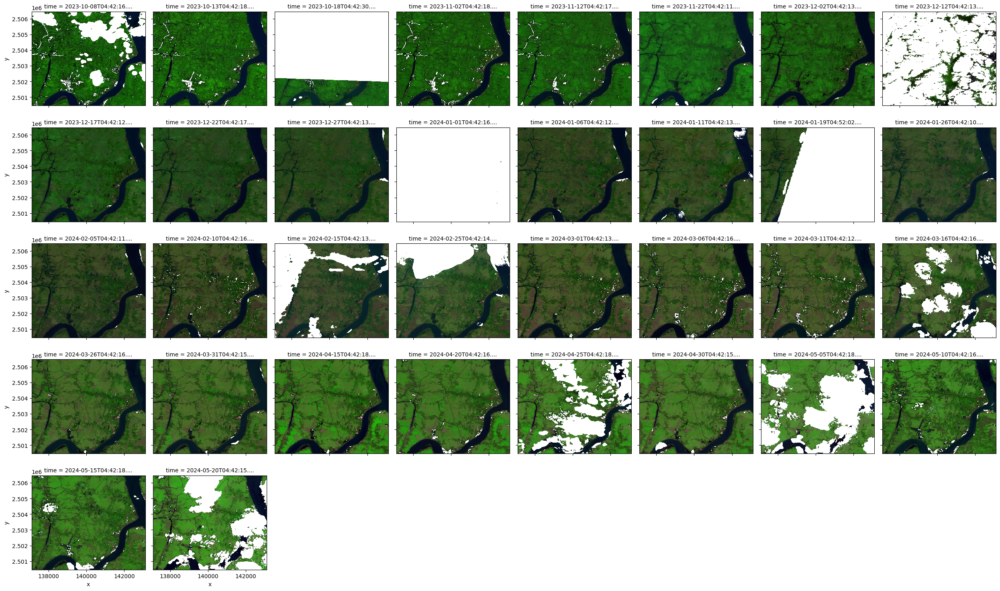

In [12]:
# Plotting

S2[['swir22', 'nir08', 'red']].to_array().plot.imshow(col='time', col_wrap=col_wrap, vmin=0, vmax=1, size=size)
plt.show()

Note that we also include a routine that only includes images that have >20% data in the dataset. Next, we compute the image, i.e., we load into memory and is not a dask arrray anymore.

# Creating monthly composites

As an example of further processing we illustarte how to use `resample` the imagery to monthly. Then we plot the monthly timeseries and the number of observations in each monthly composite by picking the observations available in one band, in this case the `nir08` band.

/env/lib/python3.12/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


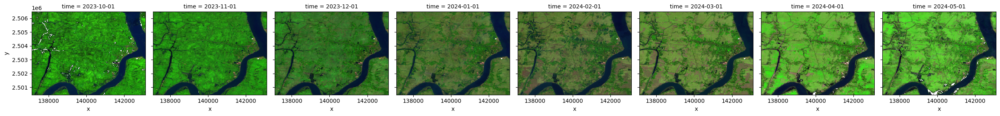

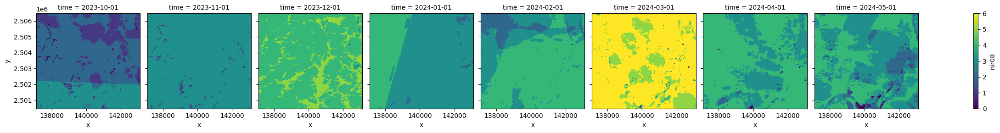

In [20]:
# Resample to one month. Also show how many obs per month. Then show again, masking anything with 1 observation only

resample_period = '1MS' # '1MS' is the key to resample to monthly

S2_res = S2.resample(time=resample_period).median(dim='time')
S2_res_n = S2['nir08'].resample(time=resample_period).count(dim='time')

size=3
col_wrap = np.minimum(len(S2_res.time),8)
S2_res[['swir22', 'nir08', 'red']].to_array().plot.imshow(col='time', col_wrap=col_wrap, vmin=0, vmax=1, size=size)
plt.show()
S2_res_n.plot.imshow(col='time', col_wrap=col_wrap, size=size, add_colorbar=True)
plt.show()

As a quality check, then we plot the monthly timeseries in false colour RGB with composites that only have one observation masked. We can see that only in October an image has only one observation in a large area.

/env/lib/python3.12/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


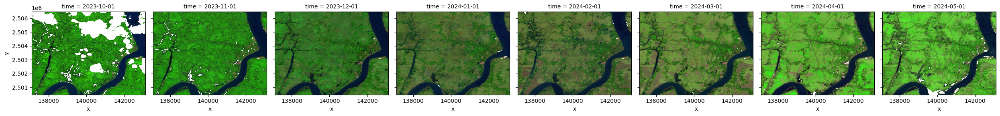

In [23]:
S2_res[['swir22', 'nir08', 'red']].where(S2_res_n > 1).to_array().plot.imshow(col='time', col_wrap=col_wrap, vmin=0, vmax=1, size=size)
plt.show()

In [24]:
# Computing, it can take a long time depending on the size of the array

#S2_res = S2_res.compute()
#S2_res

## NDVI calculation

NDVI is used to quantify vegetation greenness and is useful in understanding vegetation density and assessing changes in plant health. NDVI is calculated as a ratio between the red (R) and near infrared (NIR) values in traditional fashion: 

```
(NIR - R) / (NIR + R)
```
  

### The NDVI has various applications across different fields:

- Vegetation Monitoring: NDVI is extensively used to assess vegetation health, vigor, and biomass. It helps identify areas affected by stressors like drought, disease, or pests, aiding in early detection and mitigation of such issues.

- Crop Monitoring and Precision Agriculture: NDVI assists in crop growth monitoring, determining optimal harvest times, identifying areas requiring fertilization or irrigation, and detecting crop diseases or nutrient deficiencies.

- Land Cover Classification: NDVI can be employed to distinguish between different land cover types, such as forests, grasslands, croplands, and urban areas, by analyzing their varying NDVI values.

- Environmental Studies: NDVI provides insights into changes in land use and land cover, vegetation dynamics, deforestation, and reforestation. It helps in monitoring ecosystem health and assessing the impact of human activities on natural resources.

- Climate Change Studies: By analyzing historical NDVI data, scientists can observe long-term trends in vegetation growth and study the impact of climate change on ecosystems and biodiversity.



The NDVI index, with its simplicity and effectiveness, has become a fundamental tool for assessing vegetation conditions over large areas, enabling researchers, environmentalists, and policymakers to make informed decisions regarding land management, conservation efforts, and agricultural practices.

## Definition

In [25]:
def ndvi(ds):
    """
    Applies the NDVI using the red and nir bands in reflectance units

    Parameters:
    ds (xarray.Dataset): An xarray dataset containing bands red and nir.

    Returns:
    xarray.Dataset: The dataset with the NDVI.
    """
    
    da = (ds.nir08 - ds.red)/(ds.nir08 + ds.red)
    return da

## Run NDVI on composite

In [26]:
S2_ndvi = ndvi(S2_res)

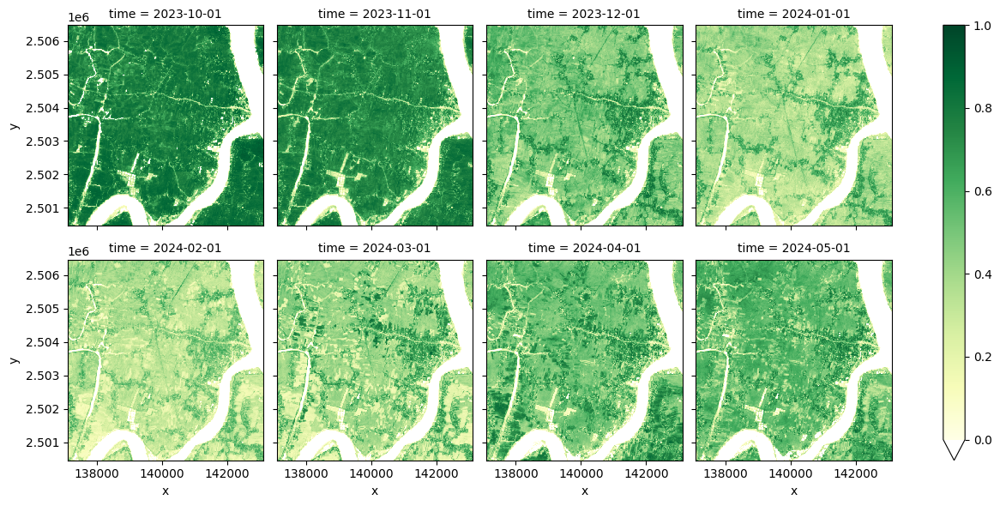

In [27]:
# Plot the timeseries

cmap = plt.get_cmap('YlGn')
cmap.set_under('white')  # Color for values less than vmin
# Very small float such that 0.0 != 0 + eps
eps = np.spacing(0.0)


S2_ndvi.plot.imshow(col='time', col_wrap=4, size=size, vmin=eps, vmax=1, cmap = cmap)
plt.show()

We plot one point of the timeseries (the bottom left corner) to see an exmaple of the NDVI monthly timeseries 

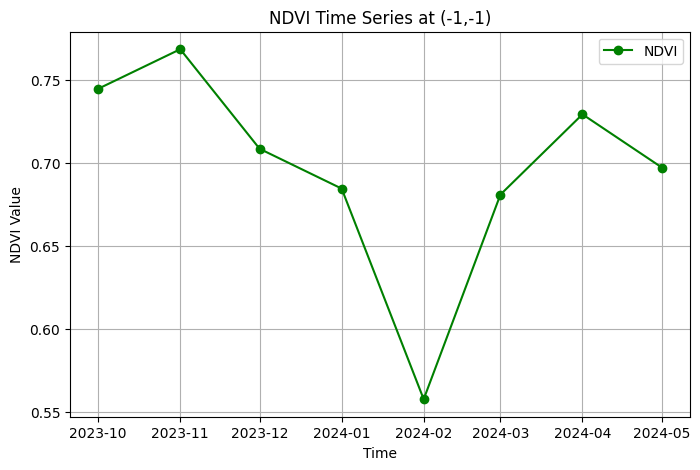

In [32]:
# Checking one point of the timeseries

ndvi_time_series = S2_ndvi.isel(x=-1, y=-1)  # Select first pixel

# Plot
plt.figure(figsize=(8, 5))
plt.plot(ndvi_time_series["time"], ndvi_time_series, marker="o", linestyle="-", color="green", label="NDVI")

# Formatting
plt.xlabel("Time")
plt.ylabel("NDVI Value")
plt.title("NDVI Time Series at (-1,-1)")
plt.grid(True)
plt.legend()
plt.show()

# Applying Savitzky-Golay to the NDVI dataset, plotting and saving

We apply the S-G filter on the third dimension of the dataset. This filter ensures that extreme values are smoothed. Then we compute the resulting smoothed NDVI data and save to server as a NetCDF.

In [41]:
# Define Savitzky-Golay filter parameters
window_length = 5  # Window size (must be odd)
polyorder = 3      # Polynomial order (≤ window_length - 1)

# Define function that applies the filter along the time axis
def apply_savgol(x, window_length, polyorder):
    """Apply Savitzky-Golay filter along the time axis, handling NaNs safely."""
    return savgol_filter(x, window_length=window_length, polyorder=polyorder, axis=0)

# Ensure S2_ndvi is a Dask-backed xarray
if not S2_ndvi.chunks:
    S2_ndvi = S2_ndvi.chunk({"time": -1, "y": 200, "x": 200})  # Adjust chunk size as needed

# ---------------- Apply Filter Efficiently Using Dask ---------------- #
NDVI_smoothed = xr.apply_ufunc(
    apply_savgol,
    S2_ndvi,
    input_core_dims=[["time"]],  # Apply along time axis
    output_core_dims=[["time"]],  # Keep same time dimension
    kwargs={"window_length": window_length, "polyorder": polyorder},
    vectorize=True,  # Apply function to each lat/lon independently
    dask="parallelized",  # Enable Dask support
    output_dtypes=[S2_ndvi.dtype],  # Maintain dtype consistency
    dask_gufunc_kwargs={"allow_rechunk": True},  # Allow chunking adjustments
)

In [42]:
# Computing, it can take a long time depending on the size of the array

NDVI_smoothed = NDVI_smoothed.compute()
NDVI_smoothed

<xarray.DataArray (y: 601, x: 601, time: 8)> Size: 12MB
array([[[0.7430204 , 0.67321104, 0.5158891 , ..., 0.386039  ,
         0.416626  , 0.48568702],
        [0.79115856, 0.7040056 , 0.51867795, ..., 0.21996775,
         0.24456185, 0.35515448],
        [0.83883417, 0.7283743 , 0.47462997, ..., 0.22191632,
         0.20613143, 0.27203092],
        ...,
        [0.77754194, 0.7863395 , 0.54718226, ..., 0.39082435,
         0.503125  , 0.53856266],
        [0.7738109 , 0.78783387, 0.5605927 , ..., 0.39719188,
         0.5058095 , 0.53585976],
        [0.705113  , 0.77567965, 0.5624332 , ..., 0.39179474,
         0.490655  , 0.5184739 ]],

       [[0.7484621 , 0.7001287 , 0.5266967 , ..., 0.43889806,
         0.447538  , 0.49520943],
        [0.7498647 , 0.6723122 , 0.49379176, ..., 0.2622375 ,
         0.2685885 , 0.3579678 ],
        [0.8045521 , 0.7160978 , 0.4536214 , ..., 0.2987778 ,
         0.2928992 , 0.33490643],
...
        [0.81564087, 0.82551587, 0.7946592 , ..., 0.7003568 ,
         0.8088882 , 0.7539633 ],
        [0.8384717 , 0.81850404, 0.7883479 , ..., 0.6879833 ,
         0.7912144 , 0.7321341 ],
        [0.78398114, 0.7545562 , 0.72888756, ..., 0.6417978 ,
         0.73806065, 0.6706158 ]],

       [[0.606681  , 0.61476576, 0.5047367 , ..., 0.396485  ,
         0.39775848, 0.4150751 ],
        [0.6660822 , 0.6593528 , 0.5394869 , ..., 0.47727984,
         0.5202321 , 0.5545895 ],
        [0.64333826, 0.6620578 , 0.5368149 , ..., 0.46416155,
         0.52308744, 0.5225768 ],
        ...,
        [0.8066937 , 0.810909  , 0.7784617 , ..., 0.69306415,
         0.7845746 , 0.72526604],
        [0.80625165, 0.8053193 , 0.77732515, ..., 0.67344487,
         0.78077257, 0.71564144],
        [0.7484319 , 0.75377804, 0.7307522 , ..., 0.65359485,
         0.7476084 , 0.69273716]]], dtype=float32)
Coordinates:
  * y            (y) float64 5kB 2.506e+06 2.506e+06 ... 2.5e+06 2.5e+06
  * x            (x) float64 5kB 1.371e+05 1.371e+05 ... 1.431e+05 1.431e+05
    spatial_ref  int32 4B 32646
  * time         (time) datetime64[ns] 64B 2023-10-01 2023-11-01 ... 2024-05-01

After computing the NDVI dataset is not a `dask array` but a `xarray` saved in memory. Next we plot and save the figure.

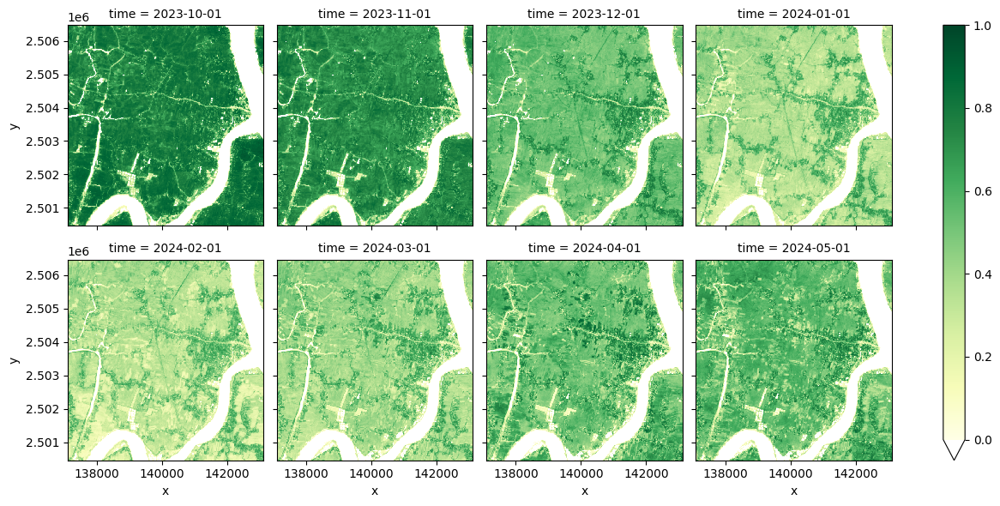

In [43]:
facet = NDVI_smoothed.plot.imshow(col='time', col_wrap=4, size=size, vmin=eps, vmax=1, cmap = cmap)
plt.draw()

In [44]:
# Make a directory to save outputs to
output_path = Path.home() / 'test_notebooks/output'
if not output_path.exists(): output_path.mkdir()
outdir = '/home/jovyan/test_notebooks/output/'
fname = outdir + 'NDVI_' + date_init + '_' + date_end + '_example.png'
facet.fig.savefig(fname, bbox_inches='tight', dpi=300)


We plot the NDVI timeseries corresponding to the lower left corner to compare against the unsmoothed data.

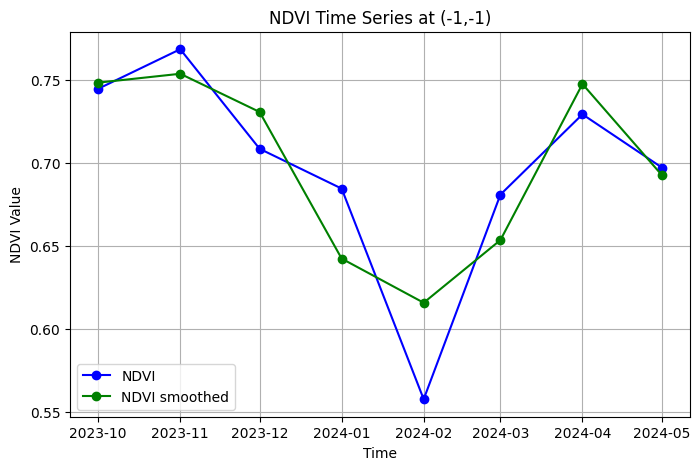

In [45]:
# Checking one point of the timeseries for smoothed and non-smoothed pixels

ndvi_time_series_smoothed = NDVI_smoothed.isel(x=-1, y=-1)  # Select last pixel

# Plot
plt.figure(figsize=(8, 5))
plt.plot(ndvi_time_series["time"], ndvi_time_series, marker="o", linestyle="-", color="blue", label="NDVI")
plt.plot(ndvi_time_series_smoothed["time"], ndvi_time_series_smoothed, marker="o", linestyle="-", color="green", label="NDVI smoothed")

# Formatting
plt.xlabel("Time")
plt.ylabel("NDVI Value")
plt.title("NDVI Time Series at (-1,-1)")
plt.grid(True)
plt.legend()
plt.show()

Next, the smoothed NDVI dataset is saved to a NetCDF file.

In [46]:
# Define output filename
fname = outdir + 'NDVI_monthly_' + date_init + '_' + date_end + '_example.nc'

# Set metadata for spatial dimensions
NDVI_smoothed.x.attrs = {
    "standard_name": "projection_x_coordinate",
    "long_name": "x coordinate of projection",
    "units": "meters"
}
NDVI_smoothed.y.attrs = {
    "standard_name": "projection_y_coordinate",
    "long_name": "y coordinate of projection",
    "units": "meters"
}

# Ensure time coordinate doesn't have conflicting 'units' or 'calendar'
for attr in ["units", "calendar"]:
    NDVI_smoothed.time.attrs.pop(attr, None)

# Convert NDVI data to dataset
dataset = NDVI_smoothed.to_dataset(name="NDVI_smoothed")

# Assign CRS before setting spatial dims
dataset = dataset.rio.write_crs("EPSG:32646")

# Define spatial_ref before setting spatial dims
dataset["spatial_ref"] = xr.DataArray(
    np.array(0),
    attrs={
        "grid_mapping_name": "universal_transverse_mercator",
        "spatial_ref": "EPSG:32646"
    }
)

# Set spatial dimensions
dataset.rio.set_spatial_dims(x_dim="x", y_dim="y", inplace=True)

# Ensure no conflict by removing existing grid_mapping in attrs & encoding
dataset["NDVI_smoothed"].attrs.pop("grid_mapping", None)
dataset["NDVI_smoothed"].encoding.pop("grid_mapping", None)

# Now safely assign grid_mapping if not present
if "grid_mapping" not in dataset["NDVI_smoothed"].attrs:
    dataset["NDVI_smoothed"].attrs["grid_mapping"] = "spatial_ref"

# Save as NetCDF
dataset.to_netcdf(fname, format="NETCDF4", engine="netcdf4")

print(f"NetCDF saved successfully with spatial metadata at {fname}!")

NetCDF saved successfully with spatial metadata at /home/jovyan/test_notebooks/output/NDVI_monthly_2023-10-01_2024-05-31_example.nc!


# Clustering with K-means

1. Prepare the Data: Reshape the `xarray.DataArray` so each pixel's time series is a feature vector.
2. Plot then last pixel.
3. Assign Clusters: Map each time series.
4. Reshape the Output: Convert the result into a uint8 xarray.DataArray.

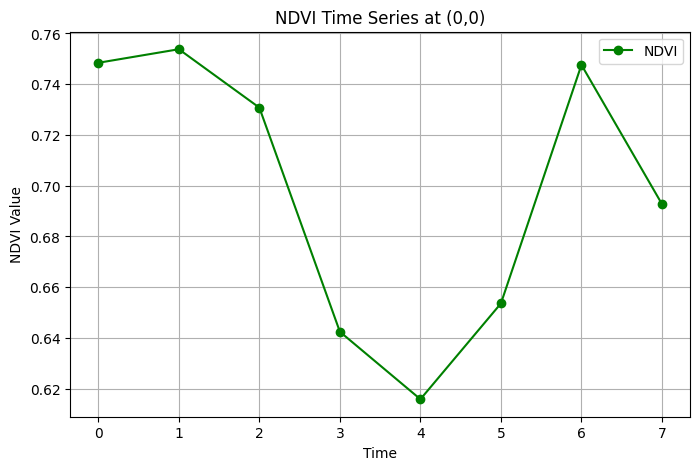

In [47]:
# Extract shape dynamically
dims = NDVI_smoothed.shape[:2]  # (601, 601)

# Reshape for clustering: Each pixel's time series becomes a feature vector
NDVI_values = NDVI_smoothed.values.reshape(-1, 8)  # Shape (361201, 8)

# Checking one point of the timeseries

ndvi_time_series = NDVI_values[361200,:]  # Select first pixel

# Plot
plt.figure(figsize=(8, 5))
plt.plot(ndvi_time_series, marker="o", linestyle="-", color="green", label="NDVI")

# Formatting
plt.xlabel("Time")
plt.ylabel("NDVI Value")
plt.title("NDVI Time Series at (0,0)")
plt.grid(True)
plt.legend()
plt.show()


## K-Means Clustering (Euclidean Distance)

K-Means is a centroid-based clustering method that minimizes the Euclidean distance between samples and their assigned cluster centers.


In [48]:
# Extract shape dynamically
dims = NDVI_smoothed.shape[:2]  # (601, 601)

# Flatten spatial dimensions
NDVI_flat = NDVI_smoothed.values.reshape(-1, 8)  # Shape (361201, 8)

# Identify valid rows (no NaN values)
valid_mask = ~np.isnan(NDVI_flat).any(axis=1)
NDVI_valid = NDVI_flat[valid_mask]  # Shape (355571, 8)

# ---------------- K-MEANS CLUSTERING ---------------- #
n_clusters = 20
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
labels_kmeans = kmeans.fit_predict(NDVI_valid) + 1  # Labels 1-12

# Create full-sized array with shape (361201,)
cluster_kmeans = np.zeros(NDVI_flat.shape[0], dtype=np.uint8)  # ✅ Correct size
cluster_kmeans[np.where(valid_mask)[0]] = labels_kmeans  # ✅ Correct indexing

# Reshape back to (601, 601)
cluster_kmeans = cluster_kmeans.reshape(dims)

# ---------------- CONVERT TO XARRAY ---------------- #
attrs_filtered = {key: NDVI_smoothed.attrs[key] for key in ["grid_mapping", "crs"] if key in NDVI_smoothed.attrs}

cluster_kmeans_xr = xr.DataArray(
    cluster_kmeans,
    coords={"y": NDVI_smoothed["y"], "x": NDVI_smoothed["x"]},
    dims=["y", "x"],
    attrs=attrs_filtered,
)



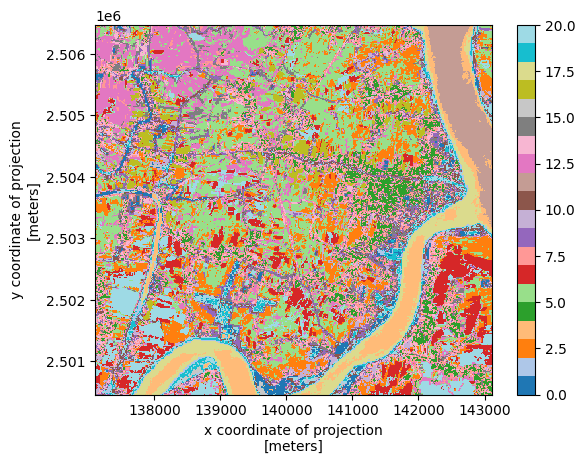

In [49]:
# Plot results
cluster_kmeans_xr.plot.imshow(cmap='tab20')

## Saving the cluster classification to GeoTIFF

In [51]:
fname = outdir + 'K_means_20_' + date_init + '_' + date_end + '_example.tif'

# Ensure correct CRS and transform metadata
cluster_kmeans_xr = cluster_kmeans_xr.rio.write_crs(NDVI_smoothed.rio.crs)  # Set CRS
cluster_kmeans_xr = cluster_kmeans_xr.rio.write_transform(NDVI_smoothed.rio.transform())  # Set affine transform


# Write to GeoTIFF with compression
cluster_kmeans_xr.rio.to_raster(
    fname,
    #driver="GTiff",
    dtype="uint8",  # Ensure correct type
    compress="DEFLATE"  # Use compression for smaller file size
)

print(f"GeoTIFF saved at: {output_path}")

GeoTIFF saved at: /home/jovyan/test_notebooks/output


## Plotting clustered timeseries

This takes time.

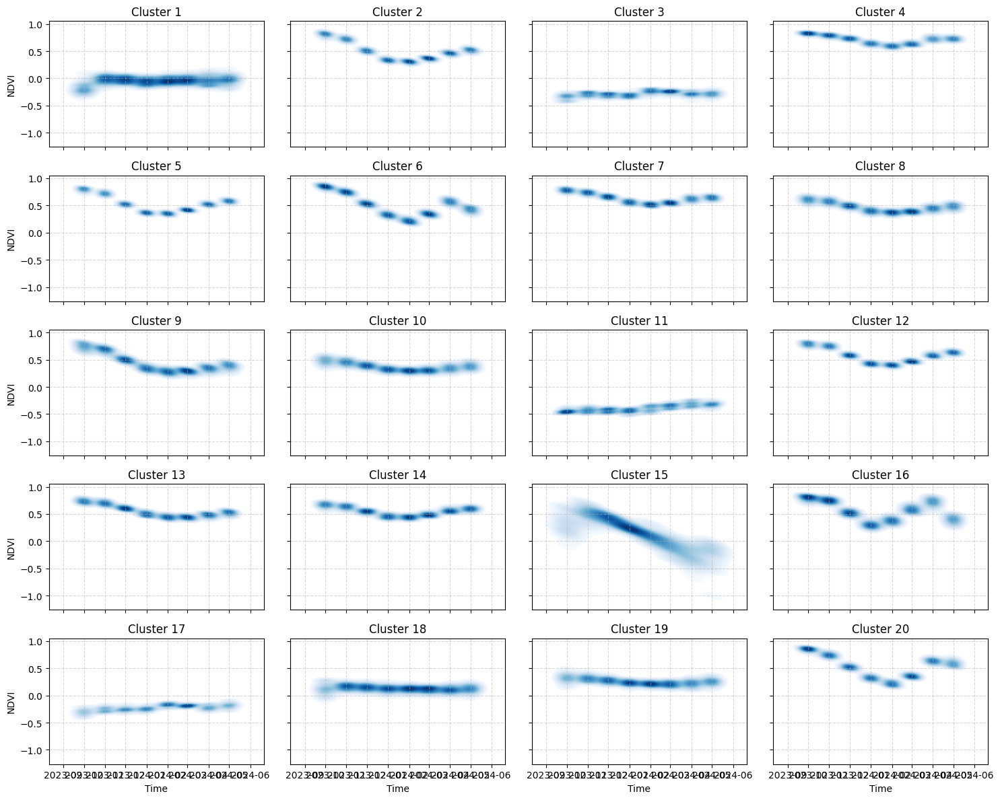

In [52]:
# NDVI_smoothed = NDVI_smoothed.compute()
# cluster_kmeans_xr = cluster_kmeans_xr.compute()

# Plotting each timeseries

# Get unique time points
time_values = NDVI_smoothed["time"].values

# Create figure
fig, axes = plt.subplots(5, 4, figsize=(15, 12), sharex=True, sharey=True)

# Flatten axes for easy iteration
axes = axes.flatten()

# Loop through each cluster (1-20)
for cluster in range(1, 21):
    ax = axes[cluster - 1]  # Select subplot
    
    # Get pixels belonging to this cluster
    mask = cluster_kmeans_xr.values == cluster
    ndvi_cluster = NDVI_smoothed.values[mask]  # Shape: (N_pixels, 8)
    
    if ndvi_cluster.size > 0:
        # Convert to DataFrame for Seaborn
        data = np.vstack([time_values] * ndvi_cluster.shape[0])  # Repeat time for each pixel
        ndvi_flattened = ndvi_cluster.flatten()
        time_repeated = data.flatten()

        # Density plot using Seaborn
        sns.kdeplot(x=time_repeated, y=ndvi_flattened, fill=True, cmap="Blues", ax=ax, levels=50)


    # Formatting
    ax.set_title(f"Cluster {cluster}", fontsize=12)
    ax.set_xlabel("Time")
    ax.set_ylabel("NDVI")
    ax.grid(True, linestyle="--", alpha=0.5)

# Adjust layout
plt.tight_layout()
plt.show()

In [53]:
# Saving figure

fname = outdir + 'K_means_20_' + date_init + '_' + date_end + '_example.png'
fig.savefig(fname, bbox_inches='tight')

# Manual classification

At this stage we can manually classify `cluster_kmeans_xr` based on the cluster **NDVI** phenologies. For this we create a lookup table, then and apply it to a copy of `cluster_kmeans_xr`.


In [55]:
# Reclassfying by first creating the lookup table

''' We assign the following values
    1 to fallow (NDVI < 0.5 during Rabi cropping season and no clear crop phenology
    2 to crops (NDVI > 0.5 and crop phenology during the Raby season
    3 to trees (NDVI > 0.5 and little seasonal variation)
    4 to bare/urban (NDVI <0.3 and little seasonal variation)
    5 to water (negative NDVI during the Rabi season)
'''

reclass_map = {
    0: 0,
    1: 4,
    2: 1,
    3: 5,
    4: 3,
    5: 1,
    6: 2,
    7: 3,
    8: 3,
    9: 1,
    10: 1,
    11: 5,
    12: 2,
    13: 1,
    14: 1,
    15: 5,
    16: 2,
    17: 5,
    18: 1,
    19: 1,
    20: 2
}

# Convert dictionary to a numpy vectorized function for efficiency
reclassify_func = np.vectorize(lambda x: reclass_map.get(x, np.nan))  # Default to NaN if not in map

# Create a copy of the original xarray.DataArray and apply reclassification
classified_xr = cluster_kmeans_xr.copy()
classified_xr.values = reclassify_func(cluster_kmeans_xr.values)

## Plotting results 

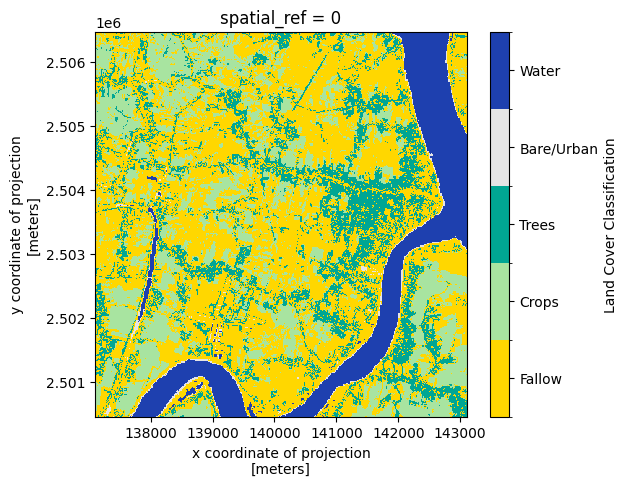

In [57]:
# Plot results using a defined custom colourmap

# Define colors and labels
colors = [
    "#000000",   # 0 = Black (Unused, but kept for alignment)
    "#FFD700",   # 1 = Yucca Yellow → Fallow
    "#A8E4A0",   # 2 = Light Apple → Crops
    "#00A693",   # 3 = Peacock Green → Trees
    "#E5E5E5",   # 4 = Gray 10% → Bare/Urban
    "#1E40AF"    # 5 = Sodalite Blue → Water
]

labels = ["Fallow", "Crops", "Trees", "Bare/Urban", "Water"]

# Create a ListedColormap
cmap = mcolors.ListedColormap(colors[1:])  # Exclude index 0

# Create boundaries and normalization
bounds = np.arange(0.5, 6.5, 1)  # Midpoints for class boundaries
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# Plot using imshow
fig, ax = plt.subplots(figsize=(6, 5))
im = classified_xr.plot.imshow(cmap=cmap, norm=norm, ax=ax, add_colorbar=False)

# Add custom colorbar
cbar = plt.colorbar(im, ax=ax, ticks=np.arange(1, 6))
cbar.set_ticklabels(labels)  # Assign labels to colorbar

# Set colorbar title
cbar.set_label("Land Cover Classification")

# Show the plot
plt.show()

## Saving to Geotiff

In [58]:
fname = outdir + 'Unsup_class_' + date_init + '_' + date_end + '_example.tif'

# Ensure correct CRS and transform metadata
classified_xr = classified_xr.rio.write_crs(NDVI_smoothed.rio.crs)  # Set CRS
classified_xr = classified_xr.rio.write_transform(NDVI_smoothed.rio.transform())  # Set affine transform


# Write to GeoTIFF with compression
classified_xr.rio.to_raster(
    fname,
    #driver="GTiff",
    dtype="uint8",  # Ensure correct type
    compress="DEFLATE"  # Use compression for smaller file size
)

print(f"GeoTIFF saved at: {output_path}")

GeoTIFF saved at: /home/jovyan/test_notebooks/output
